# AdaBoost

In [1]:
%load_ext jupyter_black
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split

from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

## Binary case
1. **Initialize** the data weighting coefficients $\{w_n\}$ by setting  
   $$
   w_n^{(1)} = \frac{1}{N} \quad \text{for } n = 1, \ldots, N.
   $$

2. For $m = 1, \ldots, M$:

   (a) **Fit a classifier** $y_m(\mathbf{x})$ to the training data by minimizing the weighted error function  
   $$
   J_m = \sum_{n=1}^N w_n^{(m)} I\left(y_m(\mathbf{x}_n) \neq t_n\right) 
   $$
   where $I(y_m(\mathbf{x}_n) \neq t_n)$ is the indicator function, which equals 1 when $y_m(\mathbf{x}_n) \neq t_n$ and 0 otherwise.

   (b) **Evaluate** the quantities  
   $$
   \varepsilon_m = \frac{
     \sum_{n=1}^N w_n^{(m)} I\left(y_m(\mathbf{x}_n) \neq t_n\right)
   }{
     \sum_{n=1}^N w_n^{(m)}
   } 
   $$
   and then use these to evaluate  
   $$
   \alpha_m = \ln \left\{ \frac{1 - \varepsilon_m}{\varepsilon_m} \right\}
   $$

   (c) **Update** the data weighting coefficients  
   $$
   w_n^{(m+1)} = w_n^{(m)} \exp\left\{ \alpha_m I\left(y_m(\mathbf{x}_n) \neq t_n\right) \right\}
   $$


In [2]:
# Generate 2D data
X, y = make_moons(n_samples=300, noise=0.25, random_state=42)
y = 2 * y - 1  # Convert to {-1, 1}
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# Train AdaBoost
ada = AdaBoostClassifier(
    estimator=DecisionTreeClassifier(max_depth=1),
    n_estimators=100,
    # algorithm="SAMME" <--- actualy, the only algorithm supported in sklearn
)
ada.fit(X_train, y_train)

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1),
                   n_estimators=100)

In [3]:
# find weights for scatter plot
def get_sample_weights_per_stage(ada, X, y):
    """Recalculate sample weights at each stage of boosting"""
    n_samples = len(X)
    weights = np.ones(n_samples) / n_samples
    stage_weights = []

    for estimator, alpha in zip(ada.estimators_, ada.estimator_weights_):
        stage_weights.append(weights.copy())
        pred = estimator.predict(X)
        incorrect = (y != pred).astype("float")
        weights *= np.exp(alpha * incorrect)
        weights = weights / weights.sum()

    return stage_weights


stage_weights = get_sample_weights_per_stage(ada, X_train, y_train)
stage_weights
# stage_weights = [np.ones_like(y) for clf in ada.estimators_]

[array([0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619, 0.0047619,
        0.0047619, 0.0047619, 0.004761

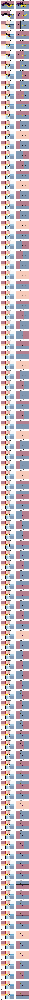

In [4]:
def plot_stages(estimator, weights_per_stage):
    n_estimators = len(estimator.estimators_)
    fig, axes = plt.subplots(n_estimators, 2, figsize=(12, 4 * n_estimators))
    xx, yy = np.meshgrid(np.linspace(-2, 3, 300), np.linspace(-2, 2, 300))
    X_grid = np.c_[xx.ravel(), yy.ravel()]

    cumulative_pred = np.zeros_like(xx)
    for i in range(n_estimators):
        ax_left, ax_right = axes[i]
        tree = estimator.estimators_[i]
        weight = estimator.estimator_weights_[i]
        sample_weights = weights_per_stage[i]
        point_sizes = 200 * sample_weights / np.max(sample_weights)
        pred_grid = tree.predict(X_grid).reshape(xx.shape)
        cumulative_pred += weight * pred_grid

        # -- Left: cumulative raw score as heatmap + boundary --
        im = ax_left.contourf(
            xx, yy, cumulative_pred, levels=100, cmap="RdBu", alpha=0.5
        )
        ax_left.contour(
            xx, yy, cumulative_pred, levels=[0], colors="k", linewidths=1.2
        )  # decision boundary
        ax_left.scatter(
            X_train[:, 0],
            X_train[:, 1],
            c=y_train,
            s=point_sizes,
            edgecolors="black",
            # cmap="bwr",
        )
        ax_left.set_title(f"Cumulative after {i+1} learners\nWeight = {weight:.2f}")

        # -- Right: single estimator prediction --
        ax_right.contourf(xx, yy, pred_grid, levels=100, cmap="RdBu", alpha=0.5)
        ax_right.contour(xx, yy, pred_grid, levels=[0], colors="k", linewidths=1.2)
        ax_right.scatter(
            X_train[:, 0],
            X_train[:, 1],
            c=y_train,
            s=point_sizes,
            edgecolors="black",
            # cmap="RdBu",
        )
        ax_right.set_title(f"Estimator {i+1} prediction\nWeight = {weight:.2f}")
        # break
    plt.tight_layout()
    plt.show()


plot_stages(ada, stage_weights)

### Equivalent Loss and the SAMME Extension for Multiclass

AdaBoost, in its binary classification form, can be interpreted as minimizing an **exponential loss** function over the training data. Specifically, given training examples $(x_i, y_i)$ with labels $y_i \in \{-1, +1\}$, the AdaBoost algorithm **greedy minimizes the following loss**:

$$
\mathcal{L}_{\text{AdaBoost}} = \sum_{i=1}^n \exp(-y_i F(x_i))
$$

where $$F(x) = \sum_{t=1}^T \alpha_t h_t(x)$$ is the ensemble's weighted prediction.


In the multiclass setting, where $y_i \in \{1, 2, \ldots, K\}$, the **SAMME** (Stagewise Additive Modeling using a Multiclass Exponential loss function) algorithm extends AdaBoost by modifying the loss function. The corresponding loss minimized by SAMME is a **multiclass exponential loss**, given by:

$$
\mathcal{L}_{\text{SAMME}} = \sum_{i=1}^n \exp\left( -\frac{1}{K} \left( f_{y_i}(x_i) - \max_{k \neq y_i} f_k(x_i) \right) \right)
$$

Here, $f_k(x)$ represents the score (or logit) assigned to class $k$ by the ensemble. This formulation encourages the correct class to have a higher score than all incorrect ones.

**Key Differences:**

- SAMME introduces a margin between the correct class and the highest-scoring incorrect class.
- The exponential loss still governs the optimization, but adapted to handle multiple classes.

For stronger classifiers that can output class probabilities, **SAMME.R** (a variant of SAMME) is often preferred as it leverages probabilistic outputs for better performance.


# Implementation

In [48]:
import numpy as np
from collections import Counter, defaultdict
from sklearn.base import BaseEstimator, ClassifierMixin


class ID3Classifier(BaseEstimator, ClassifierMixin):
    """
    Класс-реализация алгоритма построения дерева решений ID3
    с интерфейсом, совместимым со scikit-learn.
    """

    def __init__(self, max_depth=None, min_samples_split=2, min_samples_leaf=1):
        """
        Параметры:
        ----------
        max_depth : int или None - Максимальная глубина дерева. Если None, глубина не ограничена.
        min_samples_split : int - Минимальное число объектов в узле, чтобы пытаться его разбивать.
        min_samples_leaf : int - Минимальное число объектов в листе (при меньшем числе объектов нельзя разбивать узел дальше).
        """
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.min_samples_leaf = min_samples_leaf
        self.tree_ = None

    def fit(self, X, y, sample_weights=None):
        """
        Обучает дерево на выборке (X, y).
        ----------
        X : (n_samples, n_features)
        y : (n_samples,)
        """
        X, y = self._check_X_y(X, y)

        if sample_weights is None:
            sample_weights = np.ones_like(y, dtype=np.double)
            sample_weights /= sample_weights.sum()

        # строю дерево, храню как словарь
        self.tree_ = self._build_tree(X, y, sample_weights, depth=0)
        return self

    def predict(self, X):
        """
        Предсказывает метки классов для выборки X.
        ----------
        X : array-like формы (n_samples, n_features)
        """
        X = self._check_X(X)

        predictions = []
        for x in X:
            predictions.append(self._predict_single(x, self.tree_))
        return np.array(predictions, dtype=object)

    def print_tree(self, node=None, indent=""):
        """
        Пытаюсь отрисовать дерево - получилось не очень
        """
        if node is None:
            node = self.tree_

        if node["is_leaf"]:
            print(f"{indent}Predict -> {node['class']}")
        else:
            print(f"{indent}[X_{node['feature']}]")
            for val, child in node["children"].items():
                print(f"{indent}  -> Value = {val}:")
                self.print_tree(child, indent + "    ")

    # ------------------------
    # Вспомогательные методы
    # ------------------------

    def _check_X_y(self, X, y):
        """
        Конвертация в numpy массивы на всякий случай
        """
        X = np.array(X)
        y = np.array(y)
        if len(X) != len(y):
            raise ValueError("X и y имеют разную длину")
        return X, y

    def _check_X(self, X):
        """
        Конвертация в numpy массивы на всякий случай
        """
        X = np.array(X)
        return X

    def _entropy(self, y, weights):
        """
        Вычисление энтропии листа по массиву меток.
        """
        counter = Counter(y)
        total = len(y)
        ent = 0.0
        total_weight = weights.sum()
        for cls, cls_count in counter.items():
            # p = cls_count / total
            p = weights[y == cls].sum() / total_weight
            ent -= p * np.log2(p)
        return ent

    def _information_gain(self, X_col, y, sample_weights):
        """
        Прирост информации при данном разбиении
        """
        parent_entropy = self._entropy(y, sample_weights)
        values = defaultdict(list)
        for idx, val in enumerate(X_col):
            values[val].append(idx)
        n = len(y)
        child_entropy = 0.0
        total_weigth = sample_weights.sum()
        for val_indices in values.values():
            subset_y = y[val_indices]
            subset_w = sample_weights[val_indices]
            child_entropy_part = (subset_w.sum() / total_weigth) * self._entropy(
                subset_y, subset_w
            )
            child_entropy += child_entropy_part

        return parent_entropy - child_entropy

    def _best_feature(self, X, y, sample_weights):
        """
        Выбирает признак с максимальным приростом информации.
        Возвращает индекс лучшего признака или None, если невозможно выбрать (например, все признаки не дали прироста).
        """
        best_gain = -1.0
        best_feature_idx = None
        n_features = X.shape[1]

        for feature_idx in range(n_features):
            gain = self._information_gain(X[:, feature_idx], y, sample_weights)
            if gain > best_gain:
                best_gain = gain
                best_feature_idx = feature_idx
        if best_gain <= 0:
            return None
        return best_feature_idx

    def _build_tree(self, X, y, sample_weights, depth):
        """
        Рекурсивное строю дерево.
        """
        node = {}

        # Разные критерии останова
        # Если все объекты одного класса
        if len(set(y)) == 1:
            node["is_leaf"] = True
            node["class"] = y[0]
            return node

        # Если достигнута max_depth
        if self.max_depth is not None and depth >= self.max_depth:
            node["is_leaf"] = True
            node["class"] = self._majority_class(y, sample_weights)
            return node

        # Если объектов слишком мало для сплита
        if len(y) < self.min_samples_split:
            node["is_leaf"] = True
            node["class"] = self._majority_class(y, sample_weights)
            return node

        # Ищу лучший признак
        best_feat = self._best_feature(X, y, sample_weights)
        if best_feat is None:
            # Если не нашлось хорошего разбиения
            node["is_leaf"] = True
            node["class"] = self._majority_class(y, sample_weights)
            return node

        node["feature"] = best_feat
        node["is_leaf"] = False
        node["children"] = {}

        # Разбивка
        feature_values = defaultdict(list)
        for i, val in enumerate(X[:, best_feat]):
            feature_values[val].append(i)

        for val, indices in feature_values.items():
            subset_X = X[indices, :]
            subset_y = y[indices]
            subset_w = sample_weights[indices]

            # Проверка что сет достаточно большой, иначе лист
            if len(subset_y) < self.min_samples_leaf:
                child_node = {
                    "is_leaf": True,
                    "class": self._majority_class(subset_y, sample_weights),
                }
            else:
                child_node = self._build_tree(subset_X, subset_y, subset_w, depth + 1)
            node["children"][val] = child_node

        return node

    def _majority_class(self, y, sample_weights):
        """
        Просто возвращает самый частый класс
        """
        max_w, res = -np.inf, None
        for cls in np.unique(y):
            class_weight = sample_weights[y == cls].sum()
            if class_weight > max_w:
                max_w = class_weight
                res = cls
        return res
        # return Counter(y).most_common(1)[0][0]

    def _predict_single(self, x, node):
        """
        Предсказывает для одного
        """
        if node["is_leaf"]:
            return node["class"]
        feature_value = x[node["feature"]]
        if feature_value not in node["children"]:
            return self._fallback_class(node)

        return self._predict_single(x, node["children"][feature_value])

    def _fallback_class(self, node):
        """
        На всякий случай - если такого признака не было раньше
        """
        if node["is_leaf"]:
            return node["class"]
        counter = Counter()
        for child_val in node["children"].values():
            if child_val["is_leaf"]:
                counter[child_val["class"]] += 1
            else:
                self._collect_leaf_classes(child_val, counter)
        if len(counter) == 0:
            return None
        return counter.most_common(1)[0][0]

    def _collect_leaf_classes(self, node, counter):
        """
        Сбор классов для листьев
        """
        if node["is_leaf"]:
            counter[node["class"]] += 1
        else:
            for child_val in node["children"].values():
                self._collect_leaf_classes(child_val, counter)

In [51]:
# Load sample data
X, y = load_iris(return_X_y=True)
y = y.astype("object")
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Initialize and train random forest
rf = ID3Classifier()
rf.fit(
    X_train,
    y_train,
    sample_weights=(y_train != 1).astype(np.double) + 1e-6 * np.ones_like(y_train),
)

# Predict and evaluate
y_pred = rf.predict(X_test)

In [52]:
y_test, y_pred

(array([1, 0, 2, 1, 1, 0, 1, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
        0, 2, 2, 2, 2, 2, 0, 0], dtype=object),
 array([1, 0, 2, 1, 2, 0, 2, 2, 1, 1, 2, 0, 0, 0, 0, 1, 2, 1, 1, 2, 0, 2,
        0, 2, 2, 2, 2, 2, 0, 0], dtype=object))

In [53]:
(y_test == y_pred).sum() / len(y_test)

0.9333333333333333

In [ ]:
# TODO: patch our DT implementation for sample witghts support

# Bonus task 27: verify weights

Придумайте такой дизайн экспепримента, который бы позволил понять, правильно ли работает наше дерево с весами. Проверьте, и если в нем есть ошибки -- исправьте. 

# Bonus task 28: дописать adaboost

Используя нашу имплементацию дерева с весами, напишите AdaBoost.

In [ ]:
class AdaBoostScratch:
    def __init__(self, n_estimators=50):
        self.n_estimators = n_estimators
        self.estimator_weights_ = []
        self.estimators_ = []

    def fit(self, X, y):
        ...

    def predict(self, X):
        ...

scratch_boost = AdaBoostScratch(n_estimators=4)
scratch_boost.fit(X_train, y_train)
plot_stages(scratch_boost, stage_weights)